# Машинное обучение за час #

*Внимание! Этот ноутбук не способен заменить полноценный курс по ML или даже одну его лекцию. Цель данного ноутбука — показать, что это круто, интересно и даже может работать.*

<img src="files/ml.jpg">

Если вы хотите и изучить теоретические и практические основы ML, авторы рекомендуют:
1. [Курс машинному обучению от Воронцова](http://www.machinelearning.ru/wiki/index.php?title=%D0%9C%D0%B0%D1%88%D0%B8%D0%BD%D0%BD%D0%BE%D0%B5_%D0%BE%D0%B1%D1%83%D1%87%D0%B5%D0%BD%D0%B8%D0%B5_%28%D0%BA%D1%83%D1%80%D1%81_%D0%BB%D0%B5%D0%BA%D1%86%D0%B8%D0%B9%2C_%D0%9A.%D0%92.%D0%92%D0%BE%D1%80%D0%BE%D0%BD%D1%86%D0%BE%D0%B2%29)
2. Любой другой курс на Coursera
3. Очень, очень много практики

## 1. Постановка задачи ##

На [IMDb](https://www.imdb.com/) к каждому фильму расставлены теги (например, Comedy, Romance, Animation, Adventure). Давайте попробуем решить следующую задачу: по кадру из фильма определить, является ли этот фильм анимацией, или нет.  
Подобная задача называется **задачей классификации** (это когда нам нужно отнести каждый объект к определённому классу, ещё есть **задача регрессии** — например, предсказывание температуры воздуха, и **задача ранжирования** — например, определение более релевантных документов в поисковой выдаче)

<img src="files/hesher.jpg">
<h4><i><center>Это не анимация</center></i></h4>

<img src="files/secret_kells.jpg">
<h4><i><center>Это анимация</center></i></h4>

Как бы задача не была приближена к реальности, всегда стоит ввести более-менее формальную постановку задачи: мы должны ввести метрику качества, на основе которой будем принимать решение, а также понять входные и выходные параметры метода.

**Вопрос.** Что у на входе алгоритма? Что на выходе? Какая метрика качества?

*Что я думаю по этому поводу*

## 2. Загрузка данных ##

Как правило, в таких задачах есть открытая выборка, ответы для которой доступны всем, и закрытая, на которой производится итоговое тестирование алгоритма. В нашем случае открытая выборка описывается в файле *train_dataset.json*, а закрытая в *test_dataset.json*  

In [55]:
import json

def load_json_from_file(filename):
    with open(filename, "r") as f:
        return json.load(f, strict=False)

In [56]:
train_data = load_json_from_file('train_dataset.json')
train_data[0]

{'idx': 0,
 'image': 'train_data/images/0.jpg',
 'title': 'バトル・ロワイアル',
 'is_animation': False,
 'score': 7.3}

In [57]:
test_data = load_json_from_file('test_dataset.json')
test_data[0]

{'idx': 0,
 'image': 'test_data/images/0.jpg',
 'title': 'The Human Centipede (First Sequence)',
 'is_animation': False,
 'score': 4.9}

Информация о каждом фильме хранится в виде списка из словарей. Чтобы удобнее работать с такими данными, лучше представить их в виде именованных таблиц. Для этого нам поможет библиотека pandas:

In [58]:
import pandas as pd

In [59]:
train_df = pd.DataFrame(train_data)
test_df = pd.DataFrame(test_data)
train_df.head()

,idx,image,title,is_animation,score
0,0,train_data/images/0.jpg,バトル・ロワイアル,False,7.3
1,1,train_data/images/1.jpg,Return of the Seven,False,5.3
2,2,train_data/images/2.jpg,Madagascar,True,6.6
3,3,train_data/images/3.jpg,無間道III: 終極無間,False,7.0
4,4,train_data/images/4.jpg,The Net,False,5.6


Зачем это нужно? Например, мы можем в одну строку посмотреть только те фильмы, которые являются анимационными:

In [60]:
train_df[train_df.is_animation == True]

,idx,image,title,is_animation,score
2,2,train_data/images/2.jpg,Madagascar,True,6.6
8,8,train_data/images/8.jpg,装鬼兵MDガイスト2,True,4.6
15,15,train_data/images/15.jpg,Kung Fu Panda 3,True,6.7
21,21,train_data/images/21.jpg,Peter Pan,True,7.0
22,22,train_data/images/22.jpg,GHOST IN THE SHELL,True,7.8
...,...,...,...,...,...
2722,2722,train_data/images/2722.jpg,キングスグレイブ ファイナルファンタジーXV,True,6.8
2735,2735,train_data/images/2735.jpg,劇場版BLEACH The DiamondDust Rebellion もう一つの氷輪丸,True,6.5
2738,2738,train_data/images/2738.jpg,The Land Before Time XIII: The Wisdom of Friends,True,6.0
2741,2741,train_data/images/2741.jpg,Batman vs. Robin,True,6.8


Или посмотреть на самые высокооценённые фильмы:

In [61]:
train_df.sort_values(by='score', ascending=False).head(20)

,idx,image,title,is_animation,score
2412,2412,train_data/images/2412.jpg,Bowery Battalion,False,10.0
2615,2615,train_data/images/2615.jpg,僕等がいた 前篇,False,9.0
2503,2503,train_data/images/2503.jpg,Bloodfight,False,9.0
2193,2193,train_data/images/2193.jpg,Dreileben: Etwas Besseres als den Tod,False,9.0
1754,1754,train_data/images/1754.jpg,傷物語 第二部〈Ⅱ熱血篇〉,True,8.9
319,319,train_data/images/319.jpg,人間の條件 第３部望郷篇／第４部戦雲篇,False,8.5
1784,1784,train_data/images/1784.jpg,Furia à Bahia pour OSS 117,False,8.5
566,566,train_data/images/566.jpg,Üvegtigris,False,8.5
1600,1600,train_data/images/1600.jpg,人間の條件 第１部純愛篇／第２部激怒篇,False,8.5
1074,1074,train_data/images/1074.jpg,Снежная королева 3. Огонь и лед,True,8.5


In [62]:
train_df[train_df.is_animation == False]

,idx,image,title,is_animation,score
0,0,train_data/images/0.jpg,バトル・ロワイアル,False,7.3
1,1,train_data/images/1.jpg,Return of the Seven,False,5.3
3,3,train_data/images/3.jpg,無間道III: 終極無間,False,7.0
4,4,train_data/images/4.jpg,The Net,False,5.6
5,5,train_data/images/5.jpg,Che: Part Two,False,6.7
...,...,...,...,...,...
2734,2734,train_data/images/2734.jpg,Alex Cross,False,5.1
2736,2736,train_data/images/2736.jpg,Les Ripoux,False,6.5
2737,2737,train_data/images/2737.jpg,"Быстрее, чем кролики",False,6.3
2739,2739,train_data/images/2739.jpg,Sherlock Holmes Faces Death,False,7.2


**Теперь мы можем ответить на вопрос, какую метрику использовать**

Давайте также посмотрим на примеры картинок, с которыми мы будем работать

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_context('poster')

import cv2

In [64]:
import numpy as np
def visualize_examples(images, cols=3, titles=None):
    assert len(images) == len(titles)
    n_images = len(images)
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        plt.axis('off')
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 35013 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 39740 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 20853 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 12460 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 12452 missing from c

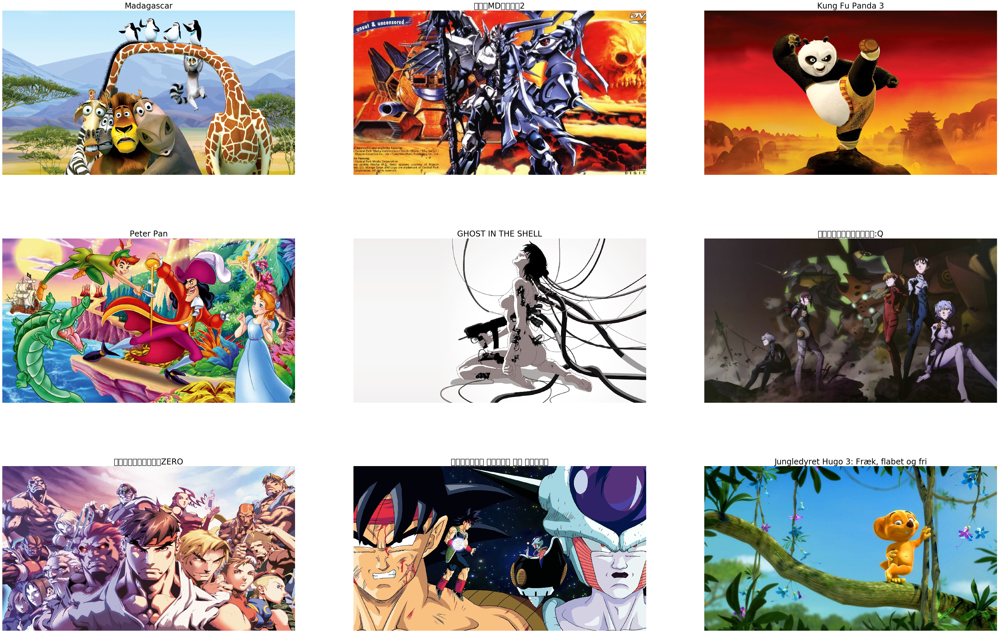

In [14]:
train_animation_sample = train_df[train_df.is_animation == True].head(9)
animation_examples = [cv2.imread(path)[:, :, ::-1] for path in train_animation_sample['image']]
visualize_examples(animation_examples, titles=train_animation_sample['title'])

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 12539 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 12525 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 12527 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:211: RuntimeWarning: Glyph 12450 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:180: RuntimeWarning: Glyph 12539 missing from c

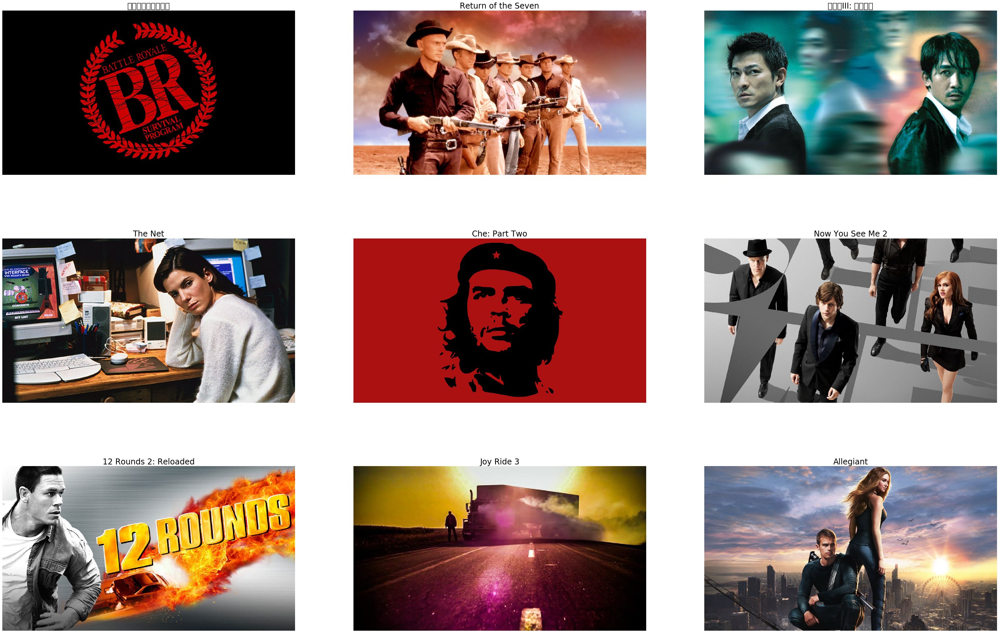

In [15]:
train_not_animation_sample = train_df[train_df.is_animation == False].head(9)
regular_examples = [cv2.imread(path)[:, :, ::-1] for path in train_not_animation_sample['image']]
visualize_examples(regular_examples, titles=train_not_animation_sample['title'])

## 3. Придумываем признаки ##

Как и в случае с детектором смен сцен, нам нужно придумать признаки, которые бы неплохо описывали природу исхожного изображения 

**Вопрос.** Какие признаки будем использовать?

In [65]:
from tqdm.notebook import tqdm

In [97]:
def features_function(image):
    #return {'pixel': image[0, 0, 0]}
    hist = cv2.calcHist([image], [0], None, [16], [0, 255])
    mean_hist = np.mean(hist)
    return {'mean_hist': mean_hist}

In [98]:
def generate_table(data):
    table = []
    for node in tqdm(data):
        current_features = {}
        image = cv2.imread(node['image'])
        
        current_features.update(features_function(image))
        
        current_features['is_animation'] = node['is_animation']
        table.append(current_features)
    return table

In [99]:
train_features = pd.DataFrame(generate_table(train_data))
test_features = pd.DataFrame(generate_table(test_data))

In [100]:
train_features

,mean_hist,is_animation
0,129600.0000,False
1,129597.5000,False
2,128733.5000,True
3,128971.9375,False
4,129436.8125,False
...,...,...
2738,57528.6250,True
2739,57600.0000,False
2740,111853.2500,False
2741,57393.5000,True


## 4. Science staff ##

<img src="files/science.jpg">

Если бы мы решали задачу обычным способом, то нам пришлось бы писать какие-то условия, выставлять пороги и т.д поверх наших признаков. По сути, машинное обучение будет решать эту задачу за нас.  
Существует очень много методов машинного обучения, каждый из них в определённых условиях может работать лучше. Чтобы понимать заранее, когда какой метод лучше использовать, нужно понимать их теорию, но мы всегда сможем перебрать все способы :3

In [101]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

In [141]:
train_X = train_features.drop('is_animation', axis=1)
train_y = train_features['is_animation']
train_y

0       False
1       False
2        True
3       False
4       False
        ...  
2738     True
2739    False
2740    False
2741     True
2742     True
Name: is_animation, Length: 2743, dtype: bool

In [103]:
test_X = test_features.drop('is_animation', axis=1)
test_y = test_features['is_animation']

In [104]:
from sklearn.metrics import roc_auc_score, f1_score, accuracy_score, precision_score

In [113]:
#clf = LogisticRegression(C=1000)
clf = RandomForestClassifier()

In [135]:
clf.fit(train_X, train_y)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [136]:
train_Y = clf.predict(train_X)
test_Y = clf.predict(test_X)

In [137]:
print('Метрика на тренировочной выборке', f1_score(train_y, train_Y))
print('Метрика на контрольной выборке', f1_score(test_y, test_Y))

Метрика на тренировочной выборке 0.9044740024183797
Метрика на контрольной выборке 0.9243697478991596


**Вопрос.** Почему на тренировочной выборке метрика лучше, чем на контрольной? Верно ли, что если на тренировочной выборке у одного алгоритма качество лучше, чем у второго, то будет ли метрика лучше на контрольной?

## 5. Эксперименты и что может пойти не так ##

Во-первых, нам немного повезло — у нас есть контрольная выборка, на которой мы всегда можем проверить качество на ней. Вообще стоит сказать, что в первую очередь стоит обращать внимание на качество именно на контрольной выборке (на которой мы не обучались), так как она именно показывает способность обобщать знания, полученные на тренировочной выборке.

В задача детектора смены сцен контрльной выборке нет — её нужно создать самому, отделив какую-то часть из тренировочной.

In [30]:
from sklearn.model_selection import train_test_split
# Разделить выборку на тренировочную и валидационную. В валидационной выборке окажется 20% всех примеров
new_train, new_val = train_test_split(train_data, test_size=0.2) 

Другой вариант — использовать кросс-валидацию, когда алгоритм обучается несколько раз, для каждого алгоритма исключается из тренировочной выборки небольшая часть примеров, на которых затем замеряются метрики.

<img src="files/cv.png">

Что ещё может пойти не так при замере метрик? В тренировочной и контрольной выборки должны быть более-менее независимые примеры. Например, в задании выше вполне могло оказаться, чтобы кадр из "Истории игрушек" был в обучении, а кадр из "Истории игрушек 2" оказался в контрольной выборке. Так делать нельзя, и такие ошибки приводят к большим расстройствам при оглашении результатов задания. 

Во-вторых, нам немного повезло, что мы достаточно быстро получили хорошее решение, и мы не пытаемся никак его улучшить. Улучшить алгоритм можно несколькими способами — например, добавить новые признаки, или опробовать новый классификатор. Важно использовать принцип "одно изменение = один эксперимент", т.е нельзя сравнивать алгоритм с предыдущей версией после 10 изменений — можно пропустить и хорошее изменение вместе с несколькими плохими, и наоборот, добавить несколько плохих изменений вместе с хорошими

В-третьих, данных может быть мало. Чтобы увеличить выборку, можно попробовать поворачивать/увеличивать/обрезать/менять яркость или контрастность. Это называется аугментацией

## 6. Немного контрольных вопросов ##

Попробуйте ответить на следующие вопросы:
* Пусть мы пытаемся определить фотографии кошек от фотографий собак. В тренировочной выборке около 500 кошек и 500 собак. Какие метрики качества можно использовать?
* Какие признаки стоит ещё попробовать для решения текущей задачи?
* Представим, что в текущей задаче было бы не по одному кадру из фильма, а по 10-20 штук. Как в таком случае разделить выборку на тренировочную и контрольную самым правильным способом?